In [1]:
import warnings
warnings.filterwarnings("ignore")
import os
import yaml
import numpy as np
from evml.keras.models import CategoricalDNN
from bridgescaler import load_scaler
import tensorflow as tf
import matplotlib.pyplot as plt
import xarray as xr

from tf_explain.core.gradients_inputs import GradientsInputs
from tf_explain.core.integrated_gradients import IntegratedGradients
from tf_explain.core.smoothgrad import SmoothGrad
from scipy.ndimage import gaussian_filter

from metpy.plots import ColdFront, WarmFront, OccludedFront, StationaryFront

import cartopy
import cartopy.crs as ccrs
import seaborn as sns
import cartopy.feature as cfeature

#from ipynb.fs.full.newfunctions import get_file_paths_rec

2023-08-01 14:58:36.221025: I tensorflow/core/util/port.cc:110] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2023-08-01 14:58:36.482937: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F AVX512_VNNI FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-01 14:58:37.445968: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


In [2]:
def get_file_paths_rec(case_study: str, model: str, date: str, hour: str)-> list:
    
    ''' Recursively extracts the full path of files & returns a list of paths'''
    
    base_path = f"/glade/campaign/cisl/aiml/ptype/ptype_case_studies/{case_study}/{model}/{date}/{hour}"
    file_paths = []
    
    for root, directories, files in os.walk(base_path):
        for filename in files:
            file_paths.append(os.path.join(root, filename))
            
    return file_paths

In [3]:
def load_model(model_path, input_scaler_file):
    """
    Load ML model and bridgescaler object.
    Args:
        model_path: Path to ML model.
        input_scaler_file: Names of the json file with scaling info
    Returns:
        Loaded Tensorflow model, bridgescaler object
    """
    config = os.path.join(model_path, "model.yml")
    with open(config) as cf:
        conf = yaml.load(cf, Loader=yaml.FullLoader)
        conf['batch_size'] = 1000

    var_names = [y for x in ['TEMP_C', 'T_DEWPOINT_C', 'UGRD_m/s', 'VGRD_m/s'] for y in conf[x]]    
    x_transformer = load_scaler(os.path.join(model_path, "scalers", input_scaler_file))

    with open(os.path.join(model_path, "model.yml")) as f:
        conf = yaml.safe_load(f)

    model = CategoricalDNN().load_model(conf)

    return model, x_transformer, var_names


def shape_ML_data(ds):
    """ reshape the data from xarray into numpy for ML mode ingestion """
    var_data = []
    da_shape = tuple(ds.dims[d] for d in ['time', 'heightAboveGround', 'y', 'x'])
    
    for var in ['t_h', 'dpt_h', 'u_h', 'v_h']:
        var_data.append(ds[var].values.reshape(da_shape[0], da_shape[1], da_shape[2] * da_shape[3]))
        
    reshaped_data = np.swapaxes(np.concatenate([v for v in var_data], axis=1), 1, 2) 
    
    return reshaped_data.squeeze()


def compute_xai(ds, model, scaler, features, class_label):
    """ Compute the Input * Gradient for a particular p-type and return as Xarray DS with coordinates """
    
    ptype_keys = dict(rain=0,
                      snow=1,
                      icep=2,
                      frzr=3)
    
    da_shape = tuple(ds.dims[d] for d in ['time', 'heightAboveGround', 'y', 'x'])
    input_data = shape_ML_data(ds)
    
    xai = GradientsInputs.compute_gradients(input_data, model.model, class_index=ptype_keys[class_label])                     # Input * Gradient
    
    #IG = IntegratedGradients.get_integrated_gradients(input_data, model.model, class_index=ptype_keys[class_label], n_steps=1) # integrated gradients

    xai = xai.numpy().reshape(1, da_shape[-2], da_shape[-1], -1)
    xai_ds = xr.Dataset(data_vars={f"{class_label}_xai":(['time', 'y', 'x', 'feature'], xai)},
                        coords=ds.coords).drop(['heightAboveGround', 'isobaricInhPa'])
    xai_ds = xai_ds.assign_coords({'feature': features})
    
    return xai_ds


def plot_xai(xai_ds, ds, ptype_, feature_, hour: str): 
    
    ''' plot the feature importance by ptype'''
    cmap_color = 'RdBu'
    ptype = ptype_
    feature = feature_
    lon = xai_ds['longitude'].values
    lat = xai_ds['latitude'].values
    data = xai_ds[f"{ptype}_xai"].sel(feature=feature).values.squeeze()
    
    # xai min val >= 0 
    #new = np.ma.masked_where(data < 0, data)
    
    fig = plt.figure(figsize=(12, 6), constrained_layout=True)
    lcc = ccrs.LambertConformal(central_longitude=-97.5, standard_parallels=(38.5, 38.5))
    ax = fig.add_subplot(1, 1, 1, projection=lcc)
    ax.set_extent([-120, -74, 25, 50], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS)
    #ax.add_feature(cfeature.LAKES, alpha=0.5)
    ax.add_feature(cfeature.STATES)
    
    p = ax.contourf(lon, lat, data, levels=np.linspace(0, 2, 15), transform=ccrs.PlateCarree(), cmap='RdBu_r')
        
    #Wind Barbs 
    wind_stride = 20 # 
    ax.barbs(ds["longitude"][::wind_stride, ::wind_stride].values, 
         ds["latitude"][::wind_stride, ::wind_stride].values, 
         ds["u10"][0, ::wind_stride, ::wind_stride].values, 
         ds["v10"][0, ::wind_stride, ::wind_stride].values,
         transform=ccrs.PlateCarree(), zorder=5, length=5, linewidth=0.5)
    
    
    
    # temperature,(2 meter temperature)
    temp_cont = ax.contour(ds["longitude"], ds["latitude"],
                       gaussian_filter(ds["t2m"][0] - 273.15, 2),
                       np.arange(-40, 45, 5), vmin=-40, vmax=40,  
                       transform=ccrs.PlateCarree(), linewidths=1, colors = 'grey')
    
    plt.clabel(temp_cont)
    
    
    ''' #pressure  
    pres_cont = ax.contour(ds["longitude"], ds["latitude"], 
           ds['mean_sea_level'][0], np.arange(992, 1050, 2), colors=['k'], linewidths=1, transform=ccrs.PlateCarree())
    
    plt.clabel(pres_cont)
    '''

    
    #title:
    plt.title("Feature Importance: " + feature + " RAP, 2022-02-23, "+str(hour)+':00:00', loc='left')
    plt.title('Ptype: {}'.format('Freezing Rain'), loc='right')
    plt.colorbar(p, orientation='horizontal', pad=0, aspect=50, extendrect=True, shrink =0.68, label = "Input * Gradient")
  

    plt.savefig(f'/glade/work/saavedrab/ptype-physical/notebooks/images/Gradient_Input_Temp0/frzr/frzr{hour}.png', dpi=300)

In [22]:
'''ptype = 'icep'
a = xai_ds[f"{ptype}_xai"].sel(feature='TEMP_C_0_m').values.squeeze()
a.max() '''

'ptype = \'icep\'\na = xai_ds[f"{ptype}_xai"].sel(feature=\'TEMP_C_0_m\').values.squeeze()\na.max() '

In [56]:
xai_ds[]

<xarray.Dataset>
Dimensions:                  (time: 1, y: 337, x: 451, feature: 84)
Coordinates:
  * time                     (time) datetime64[ns] 2022-02-23
    valid_time               datetime64[ns] 2022-02-23T10:00:00
    step                     timedelta64[ns] 10:00:00
    longitude                (y, x) float32 233.9 234.0 234.1 ... 302.4 302.6
    y_projection_coordinate  (y) float32 -5.889e+05 -5.753e+05 ... 3.962e+06
    x_projection_coordinate  (x) float32 -3.332e+06 -3.319e+06 ... 2.763e+06
    latitude                 (y, x) float32 16.28 16.31 16.34 ... 55.51 55.48
  * feature                  (feature) <U19 'TEMP_C_0_m' ... 'VGRD_m/s_5000_m'
Dimensions without coordinates: y, x
Data variables:
    rain_xai                 (time, y, x, feature) float32 2.644e-14 ... 4.61...
    snow_xai                 (time, y, x, feature) float32 -1.355e-15 ... -1....
    icep_xai                 (time, y, x, feature) float32 -8.68e-14 ... 8.81...
    frzr_xai                 (time, y, x, feature) float32 -5.831e-14 ... 9.1...

In [4]:
# load the model, input_scaler, and feature_names
model, scaler, var_names = load_model("/glade/p/cisl/aiml/ai2es/winter_ptypes/models/classifier_weighted_smallmodel", "input.json")

2023-08-01 14:58:42.967097: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:266] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


In [43]:
# load a single forecast (RAP) for a case_study
ds = xr.open_dataset('/glade/campaign/cisl/aiml/ptype/ptype_case_studies/kentucky/rap/20220223/0000/MILES_ptype_rap_2022-02-23_0000_f10.nc')
# example computing input * gradient for a single output label (freezing rain)
#frzr_xai = compute_xai(ds, model, scaler, var_names, 'frzr')
#frzr_xai

In [44]:
%%time
# get INPUT * GRADIENTS for all four p-types and merge them together in the same dataset
xai_ds = xr.merge([compute_xai(ds, model, scaler, var_names, variable) for variable in ['rain', 'snow', 'icep', 'frzr']])

CPU times: user 54.4 s, sys: 527 ms, total: 54.9 s
Wall time: 57.7 s


In [45]:
# make a new variable with all categorical ptypes for easier plotting
arr = np.zeros(shape=(ds['ML_rain'].shape))
for i, var in enumerate(['ML_crain', 'ML_csnow', 'ML_cicep', 'ML_cfrzr']):
    index = np.where(ds[var]==1)
    arr[index] = i
ds['ML_all'] = (['time', 'y', 'x'], arr)

In [36]:
#data = data[data[:,2]>=0]

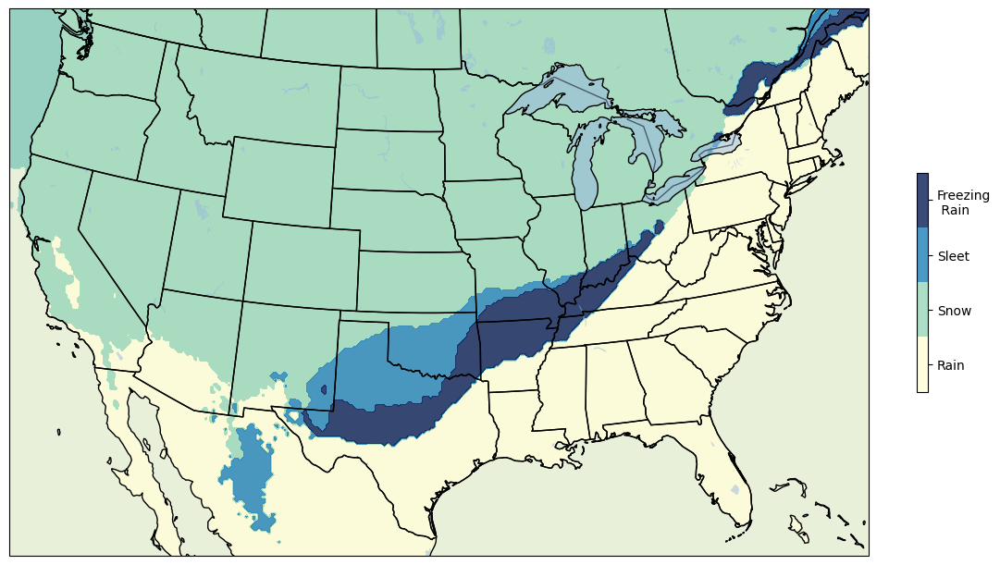

In [37]:
ptype = 'snow'
feature = 'TEMP_C_5000_m'
lon = xai_ds['longitude'].values
lat = xai_ds['latitude'].values
data = ds['ML_all'].values.squeeze()


fig = plt.figure(figsize=(12, 6), constrained_layout=True)
lcc = ccrs.LambertConformal(central_longitude=-97.5, standard_parallels=(38.5, 38.5))
ax = fig.add_subplot(1, 1, 1, projection=lcc)
ax.set_extent([-120, -74, 25, 50], crs=ccrs.PlateCarree())
ax.add_feature(cfeature.LAND)
ax.add_feature(cfeature.OCEAN)
ax.add_feature(cfeature.COASTLINE)
ax.add_feature(cfeature.BORDERS)
ax.add_feature(cfeature.LAKES, alpha=0.5)
ax.add_feature(cfeature.STATES)
cmap = plt.get_cmap('YlGnBu', 4)

p2 = ax.contourf(lon, lat, data, transform=ccrs.PlateCarree(), alpha=0.8, cmap=cmap, levels=[-0.5, 0.5, 1.5, 2.5, 3.5])
cbar = plt.colorbar(p2, shrink=0.4, ax=ax)
cbar.set_ticks(ticks=[0, 1, 2, 3])
cbar.set_ticklabels(ticklabels=['Rain', 'Snow', 'Sleet', 'Freezing\n Rain'])

### Convert raw pressure to mean sea pressure  

In [38]:
def convert_to_mslp(temperature_c, pressure_hpa, elevation_m):

    return pressure_hpa * (1 - ((0.0065 * elevation_m) / (temperature_c + (0.0065 * elevation_m) + 273.15))) ** -5.257

In [39]:
surface_temps = ds['t_h'][0, 0].values
surface_pressure = ds['isobaricInhPa_h'][0, 0].values
hgt_above_sea_level = ds['orog'][0].values

conversion = convert_to_mslp(surface_temps, surface_pressure, hgt_above_sea_level)

In [40]:
#adding the time dimension: 
conversion = np.expand_dims(conversion, axis=0)

mean_sea_level = xr.DataArray(conversion, dims=('time', 'y', 'x'))

ds['mean_sea_level'] = mean_sea_level

### Plotting best features p-type 

In [1]:
#top features per class: 
top_temp = 'TEMP_C_0_m'
top_dp = 'T_DEWPOINT_C_0_m'
top_v = 'VGRD_m/s_3000_m'
top_u = 'UGRD_m/s_2250_m'

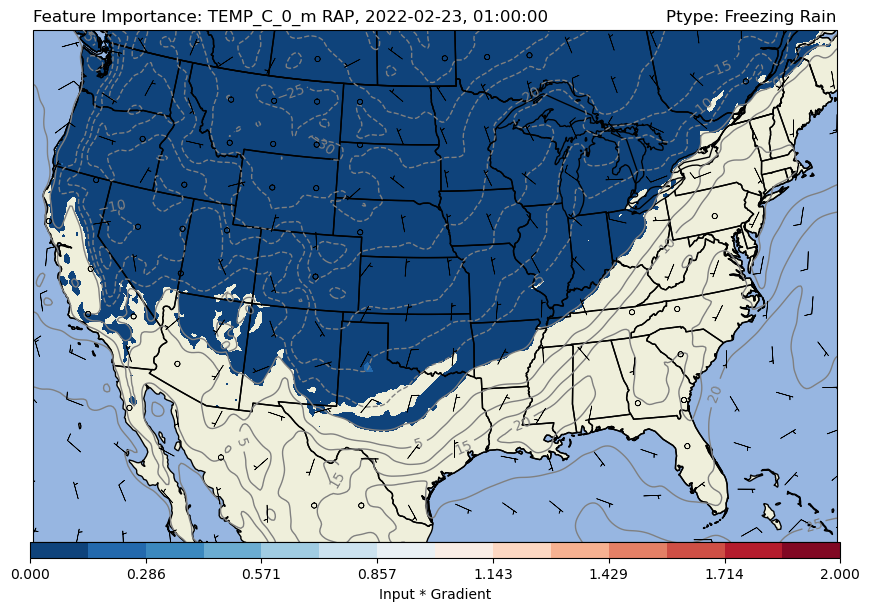

In [46]:
plot_xai(xai_ds, ds, "snow", top_temp, '01')


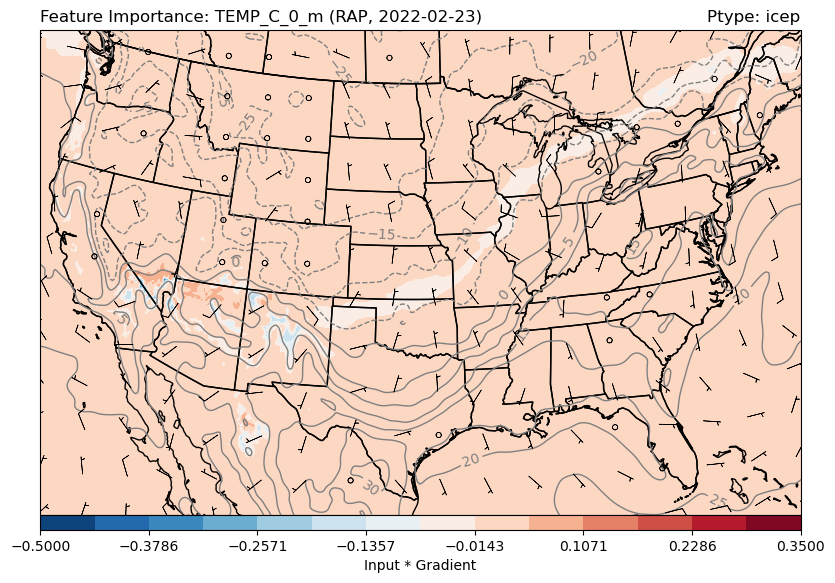

In [53]:
plot_xai(ds, "icep", top_temp)

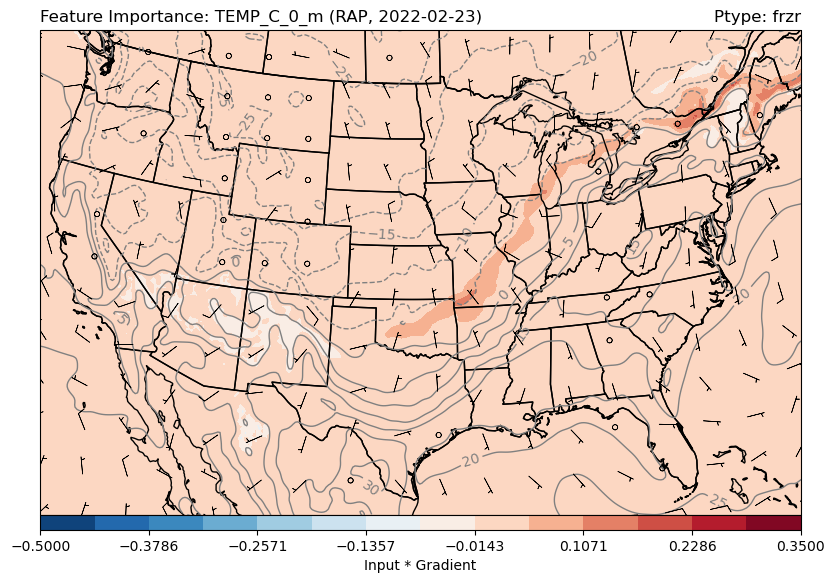

In [54]:
plot_xai(ds, "frzr", top_temp)

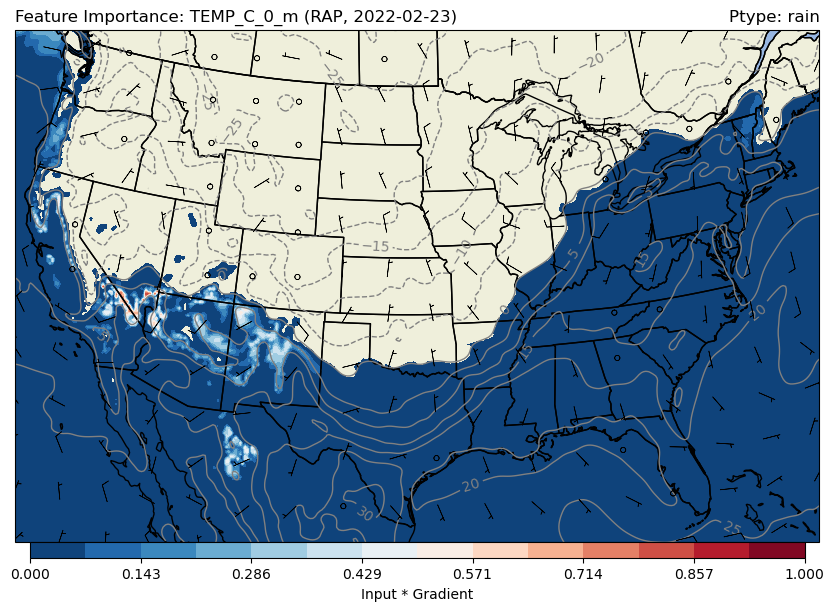

In [72]:
plot_xai(ds, "rain", top_temp)

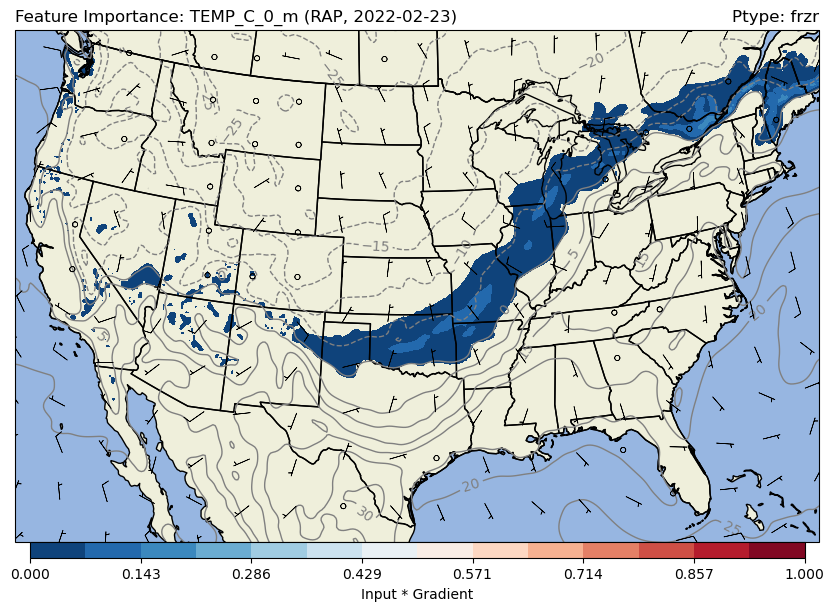

In [74]:
plot_xai(ds, "frzr", top_temp)

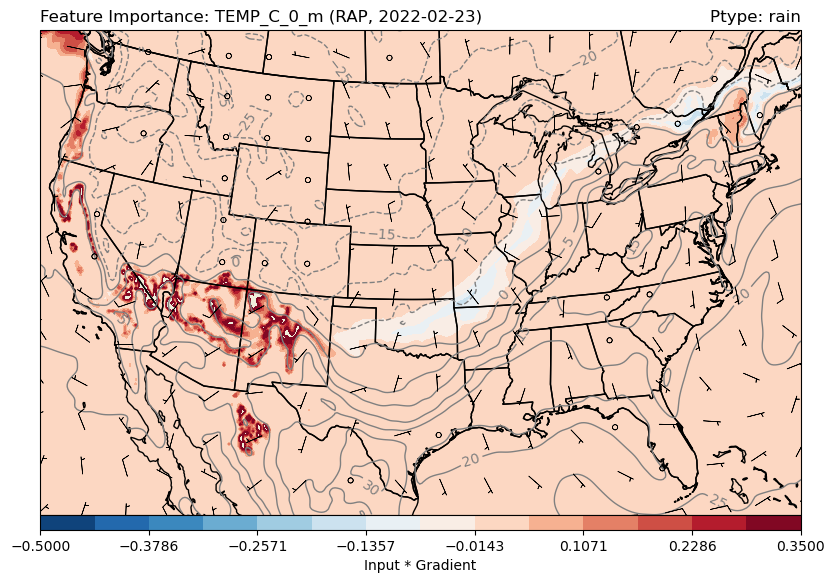

In [65]:
plot_xai(ds, "rain", top_temp) # rerun with values> =0

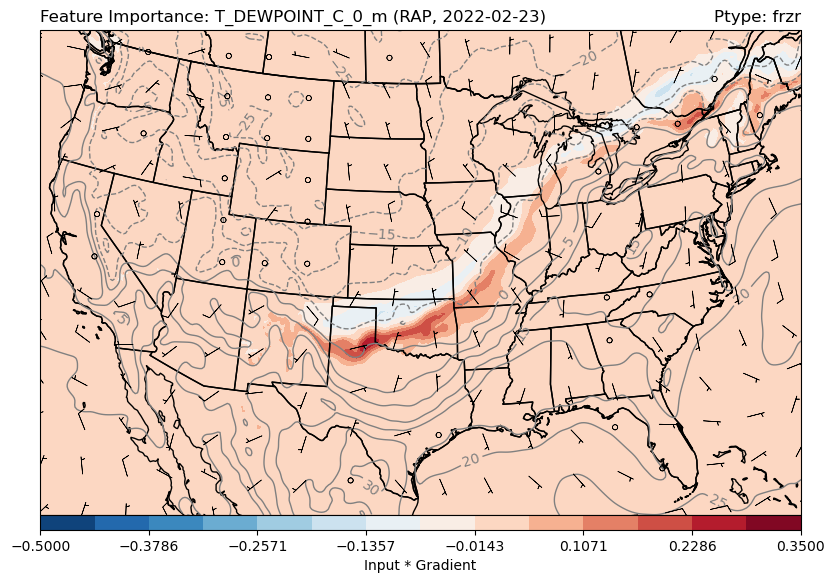

In [55]:
plot_xai(ds, "frzr", top_dp)

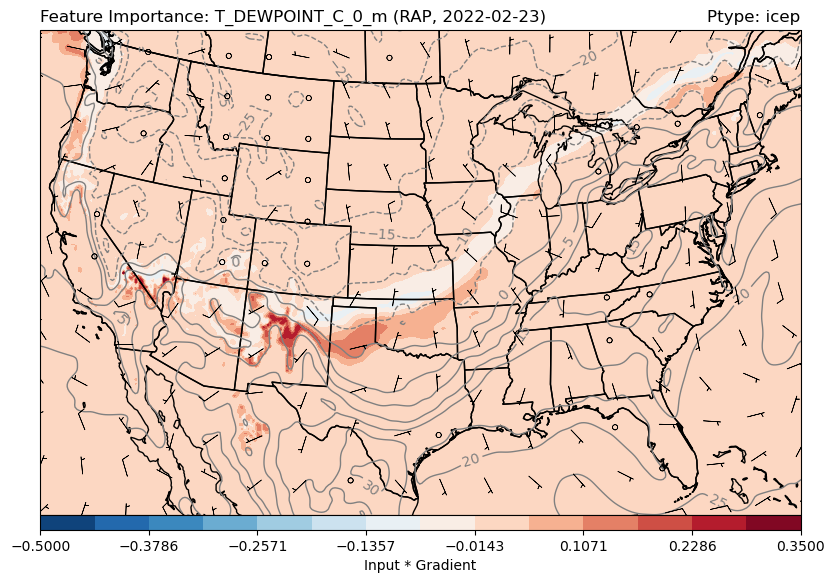

In [56]:
plot_xai(ds, "icep", top_dp)

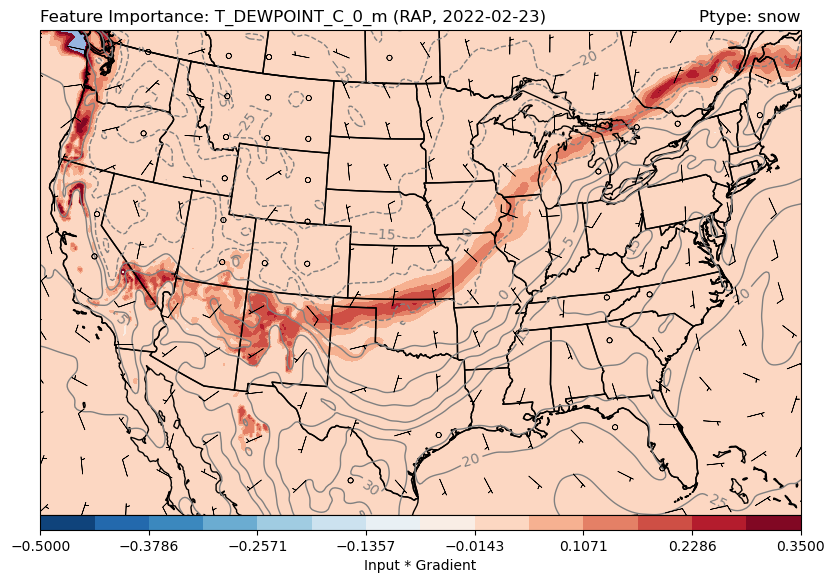

In [57]:
plot_xai(ds, "snow", top_dp)

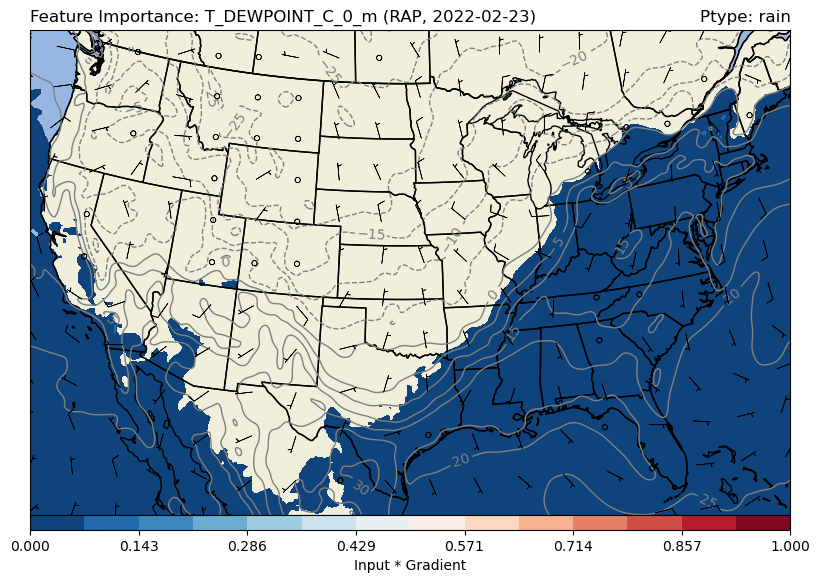

In [119]:
plot_xai(ds, "rain", top_dp)

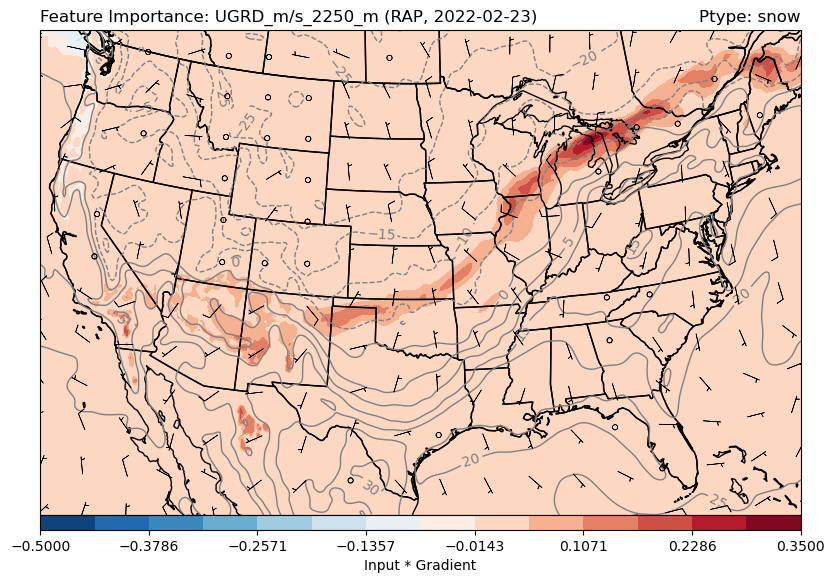

In [58]:
plot_xai(ds, "snow", top_u)

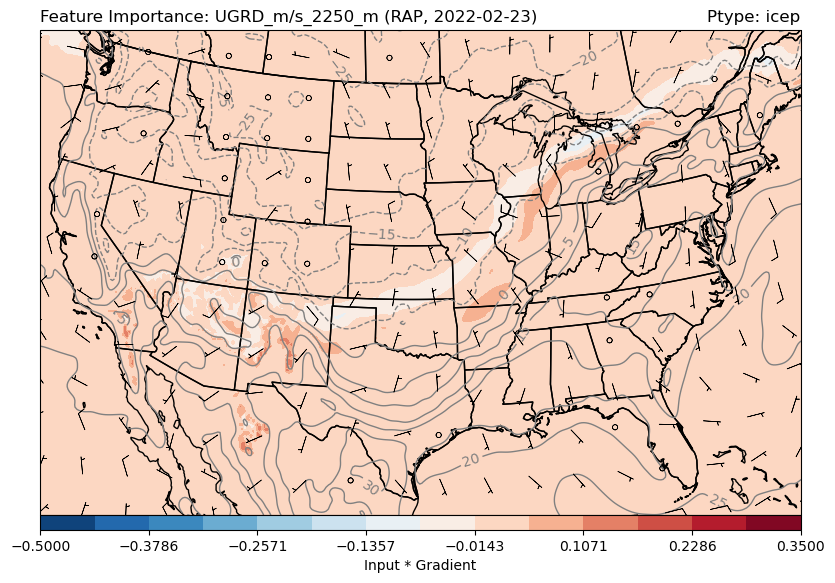

In [59]:
plot_xai(ds, "icep", top_u)

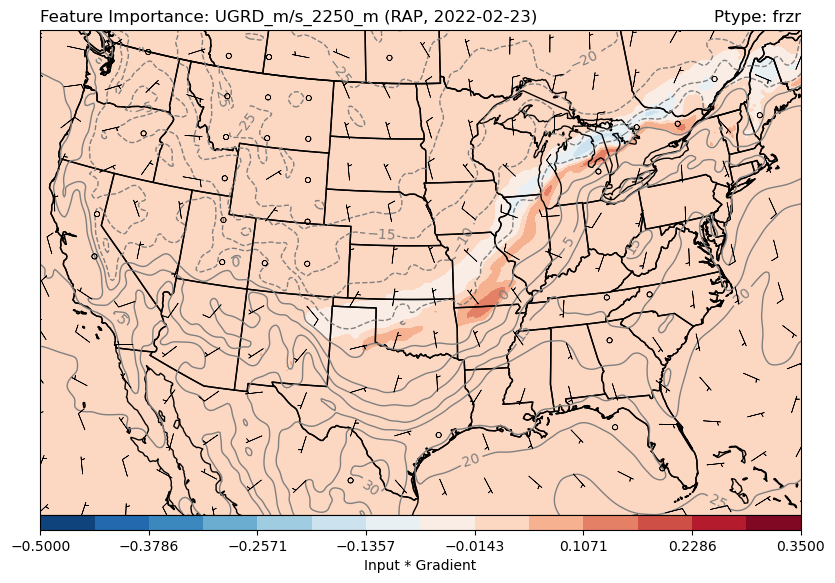

In [60]:
plot_xai(ds, "frzr", top_u)

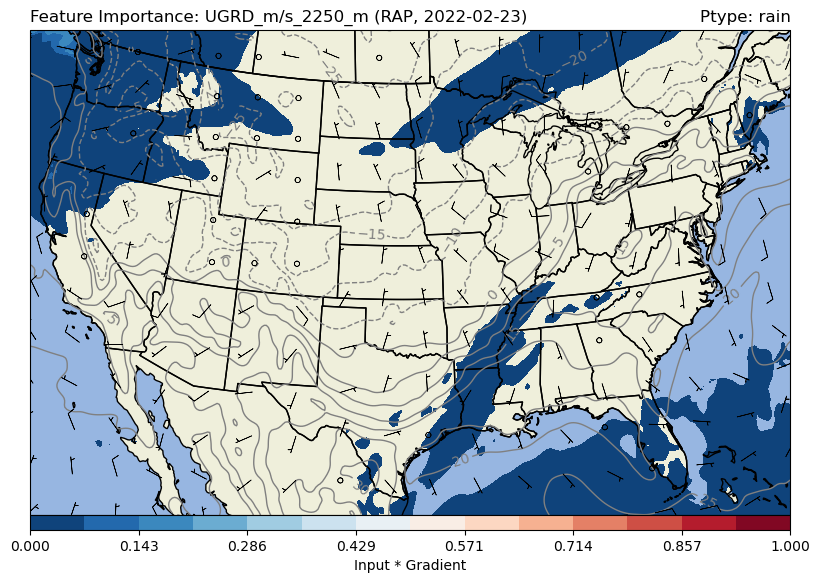

In [120]:
plot_xai(ds, "rain", top_u)

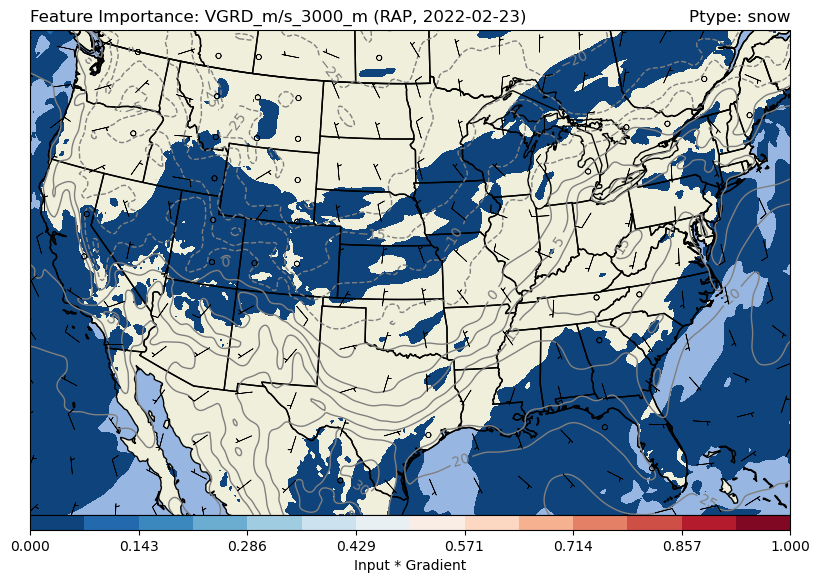

In [124]:
plot_xai(ds, "snow", top_v)

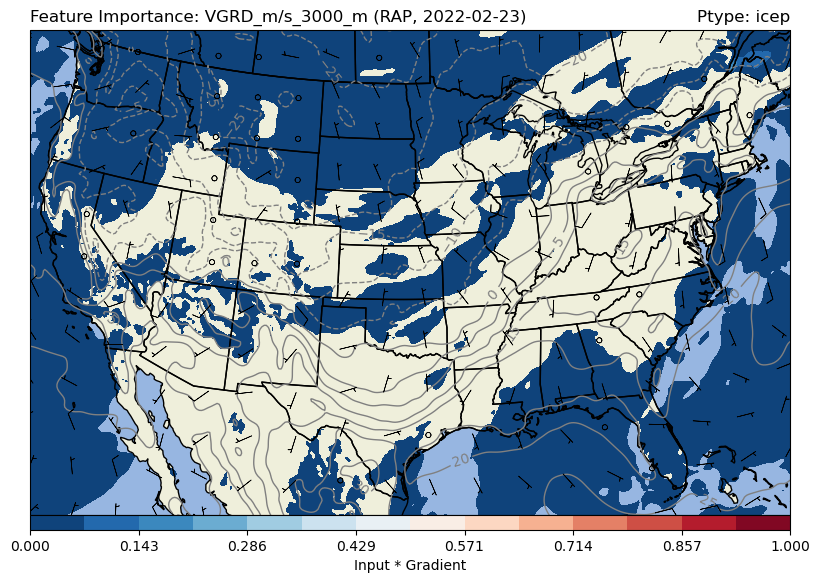

In [123]:
plot_xai(ds, "icep", top_v)

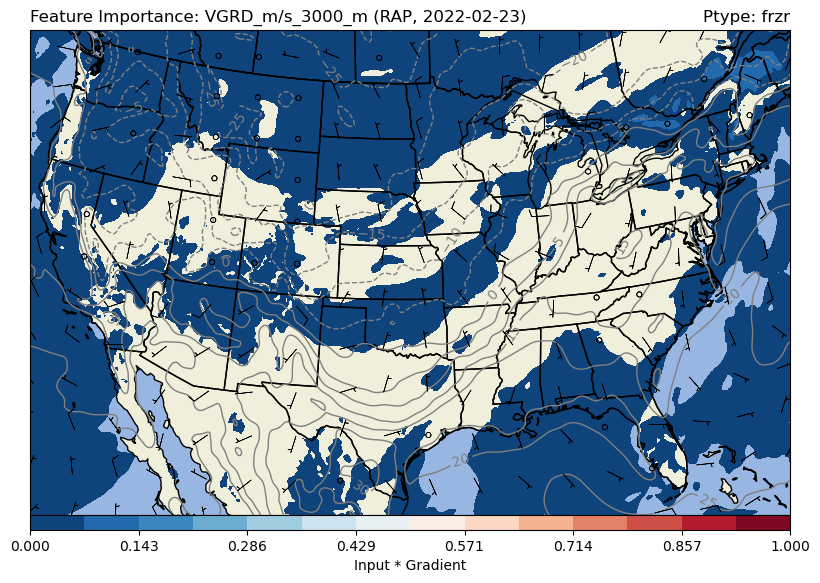

In [122]:
plot_xai(ds, "frzr", top_v)

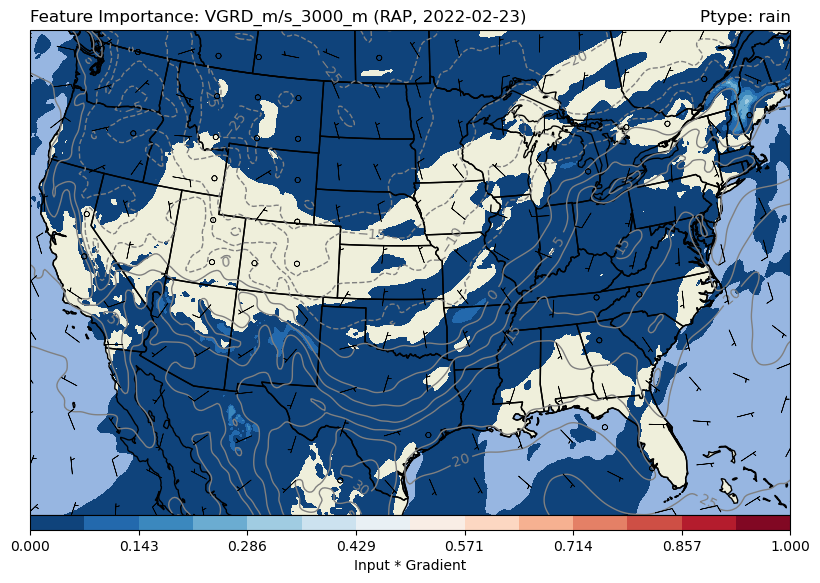

In [121]:
plot_xai(ds, "rain", top_v)

### Heights of the most important temperature

In [10]:
def plot_top_temp(xai_ds, ds, ptype_:str, hour:int):
    ptype = ptype_
    cmap_color = 'BrBG'
    feature = 'TEMP'
    lon = xai_ds['longitude'].values
    lat = xai_ds['latitude'].values
    data = xai_ds[f'{ptype}_xai'].isel(feature = slice(0,21)).argmax(dim ='feature').squeeze()*250 # feature importance of the top temperature: 0m 

    fig = plt.figure(figsize=(12, 6), constrained_layout=True)
    lcc = ccrs.LambertConformal(central_longitude=-97.5, standard_parallels=(38.5, 38.5))
    ax = fig.add_subplot(1, 1, 1, projection=lcc)
    ax.set_extent([-120, -74, 25, 50], crs=ccrs.PlateCarree())
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.COASTLINE)
    ax.add_feature(cfeature.BORDERS)
    ax.add_feature(cfeature.STATES)
    p = ax.contourf(lon, lat, data, levels=np.linspace(0, 5000, 100), transform=ccrs.PlateCarree(), cmap=cmap_color) 
 
    # temperature,(2 meter temperature)
    temp_cont = ax.contour(ds["longitude"], ds["latitude"],
                       gaussian_filter(ds["t2m"][0] - 273.15, 2),
                       np.arange(-40, 45, 5), vmin=-40, vmax=40,  
                       transform=ccrs.PlateCarree(), linewidths=1, colors = 'white')
    
    plt.clabel(temp_cont)
    '''
    # pressure contours: 
    pres_cont = ax.contour(ds["longitude"], ds["latitude"], 
           ds['mean_sea_level'][0], np.arange(992, 1050, 5), linewidths=1, transform=ccrs.PlateCarree(), colors = 'white')
    
    plt.clabel(pres_cont)'''
        
    plt.title("Heights of the most important temperature feature: "+ str(hour)+':00:00', loc='left')
    plt.title('Ptype: {}'.format('Freezing Rain'), loc='right')
    plt.colorbar(p, orientation='horizontal', pad=0, aspect=50, extendrect=True, shrink =0.674, label = "Height Above Ground")
    plt.savefig(f'/glade/work/saavedrab/ptype-physical/notebooks/images/height_GI_frzr_{hour}.png', dpi=300)

### Case Studies 

In [271]:
# kentucky RAP 
ky_rap = get_file_paths_rec('kentucky', 'rap', '20220223', '0000')
ky_rap.sort()

### Plot by height value

In [16]:
def save_images():
    ''' Load the 18 hours of the prediction and save the images ''' 
    
    for each_hour in range (10, 19):
        ds = xr.open_dataset(f'/glade/campaign/cisl/aiml/ptype/ptype_case_studies/kentucky/rap/20220223/0000/MILES_ptype_rap_2022-02-23_0000_f{each_hour}.nc')
        xai_ds = xr.merge([compute_xai(ds, model, scaler, var_names, variable) for variable in ['rain', 'snow', 'icep', 'frzr']])
        # make a new variable with all categorical ptypes for easier plotting
        arr = np.zeros(shape=(ds['ML_rain'].shape))
        for i, var in enumerate(['ML_crain', 'ML_csnow', 'ML_cicep', 'ML_cfrzr']):
            index = np.where(ds[var]==1)
            arr[index] = i
        ds['ML_all'] = (['time', 'y', 'x'], arr)
        plot_top_temp(xai_ds, ds, 'frzr', each_hour)

In [ ]:
save_images() 

### RAP, KY, 22-02-23

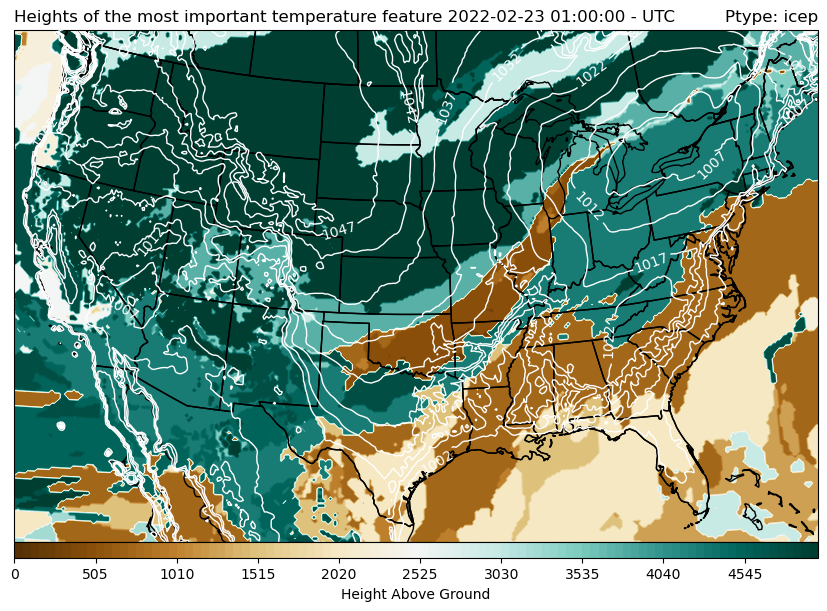

In [69]:
time = ' 2022-02-23 01:00:00 - UTC'
plot_top_temp(ds,'icep',time)

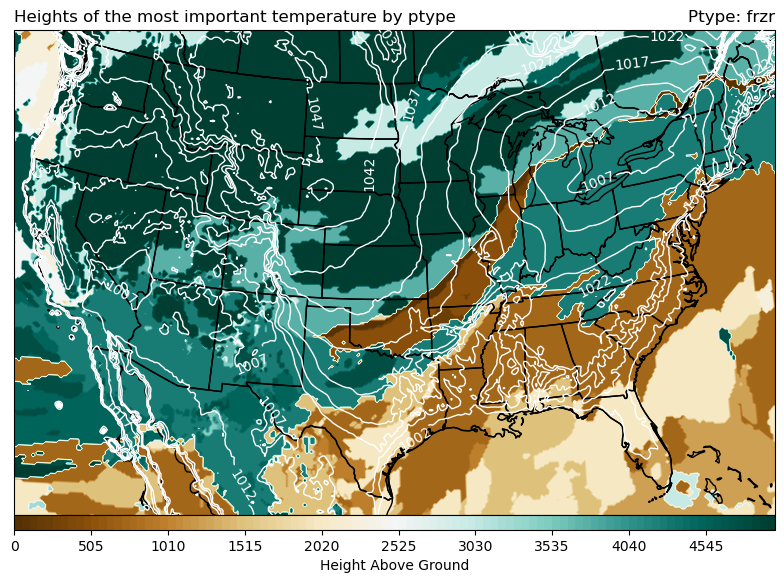

In [128]:
plot_top_temp(ds,'frzr')

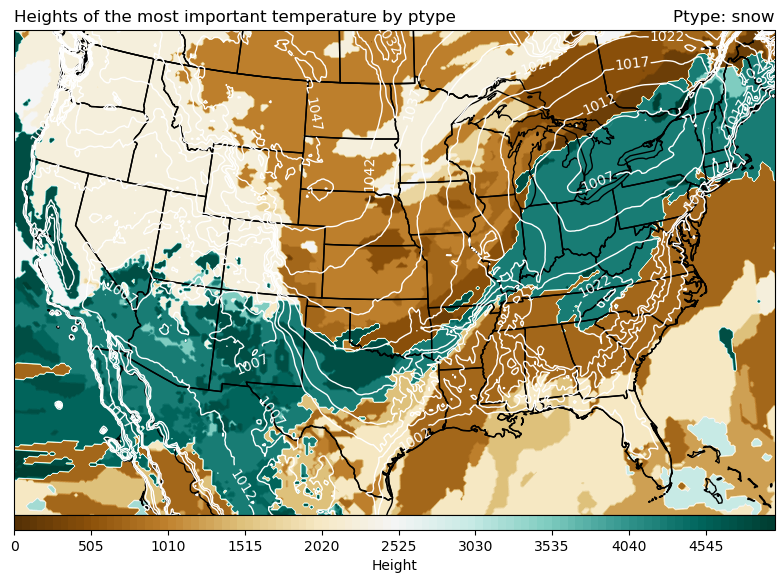

In [113]:
plot_top_temp(ds, 'snow')

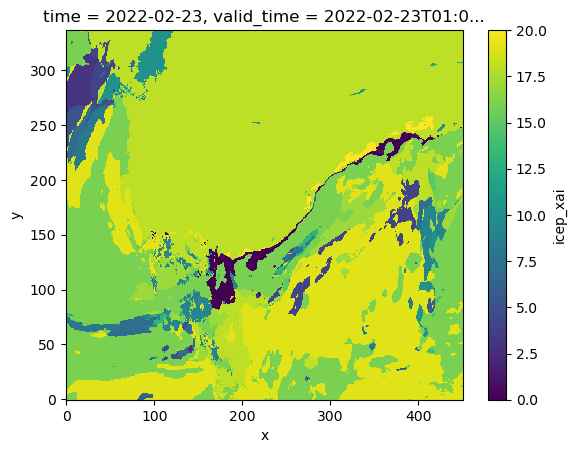

In [934]:
xai_ds['icep_xai'].isel(feature=slice(21, 42)).argmax(dim='feature').plot()

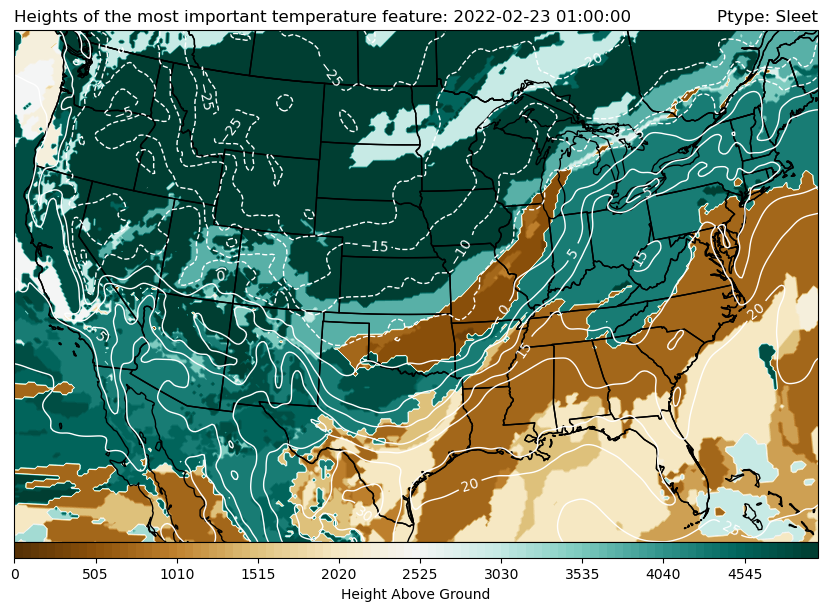

In [40]:
plot_top_temp(ds, 'icep', '2022-02-23 01:00:00')

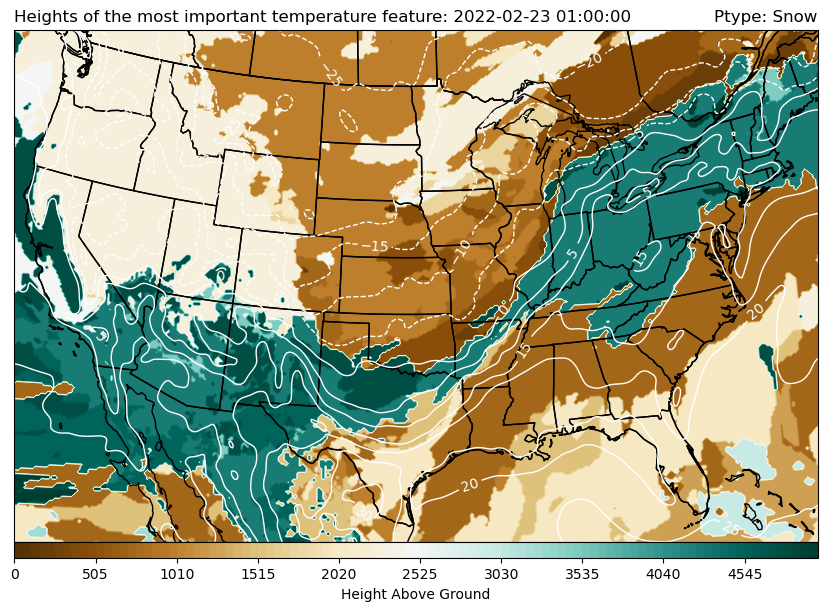

In [44]:
plot_top_temp(ds, 'snow', '2022-02-23 01:00:00')

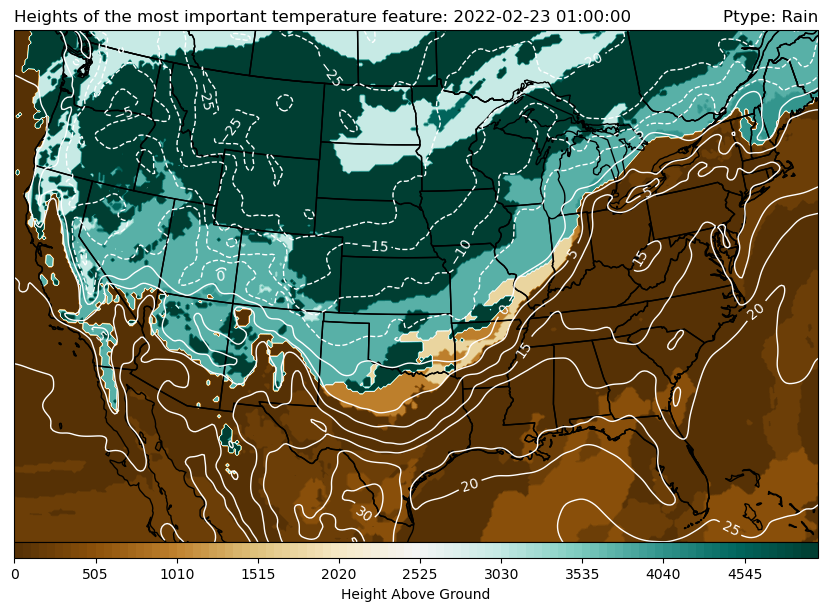

In [42]:
plot_top_temp(ds, 'rain', '2022-02-23 01:00:00')

In [ ]:
save_images(ky_rap, ds, 'icep', hours)